In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [5]:
data = pd.read_csv('climate_all_pred_2020.csv')
data.head()

,Unnamed: 0,level_0,country,year,CDA,CHA,FGA,NDA,BCA
0,0,0,Albania,1995,100.0,73.07252,0.0,78.221486,100.0
1,1,1,Albania,1996,100.0,73.07252,0.0,78.221486,100.0
2,2,2,Albania,1997,100.0,73.07252,0.0,78.221486,100.0
3,3,3,Albania,1998,100.0,73.07252,0.0,78.221486,100.0
4,4,4,Albania,1999,100.0,73.07252,0.0,78.221486,100.0


In [7]:
data.drop(columns=['Unnamed: 0','level_0'],inplace=True)

In [8]:
data = data[data['year']!=2027]
data = data[data['year']!=2026]
data = data[data['year']!=2025]
data = data[data['year']!=2024]
data = data[data['year']!=2023]
data = data[data['year']!=2022]
data = data[data['year']!=2021]

In [9]:
data['year'].unique()

array([1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005,
       2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016,
       2017, 2018, 2019, 2020], dtype=int64)

In [15]:
data['year'] = data['year'].astype(str)

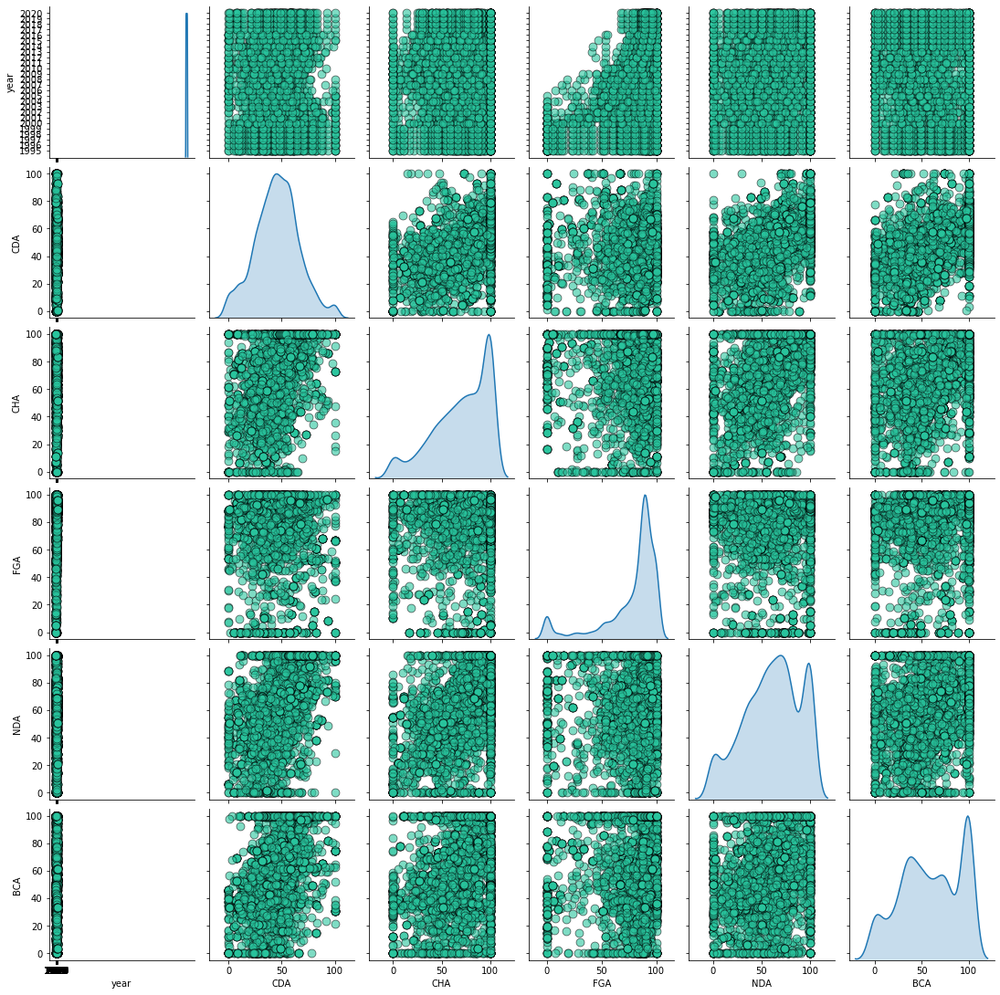

In [45]:
plt1 = sns.pairplot(data, diag_kind = 'kde', plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k', 'color':'#29c59e'})
plt.show()

In [46]:
plt1.savefig('./templates/images/pairplot.png')

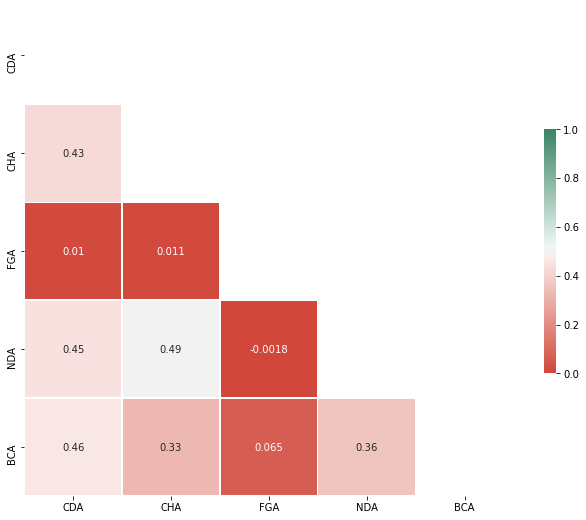

In [67]:
corr = data.corr()
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(15, 150, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, vmin=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5},annot=True)

In [68]:
f.savefig('./templates/images/corr_heatmap.png')

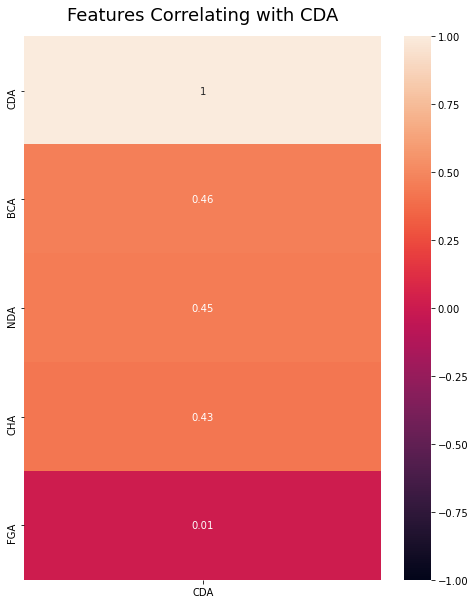

In [47]:
plt2 = plt.figure(figsize=(8, 10))
heatmap = sns.heatmap(data.corr()[['CDA']].sort_values(by='CDA', ascending=False), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Features Correlating with CDA', fontdict={'fontsize':18}, pad=16)
plt.show()

In [48]:
plt2.savefig('./templates/images/corr_heatmap.png')

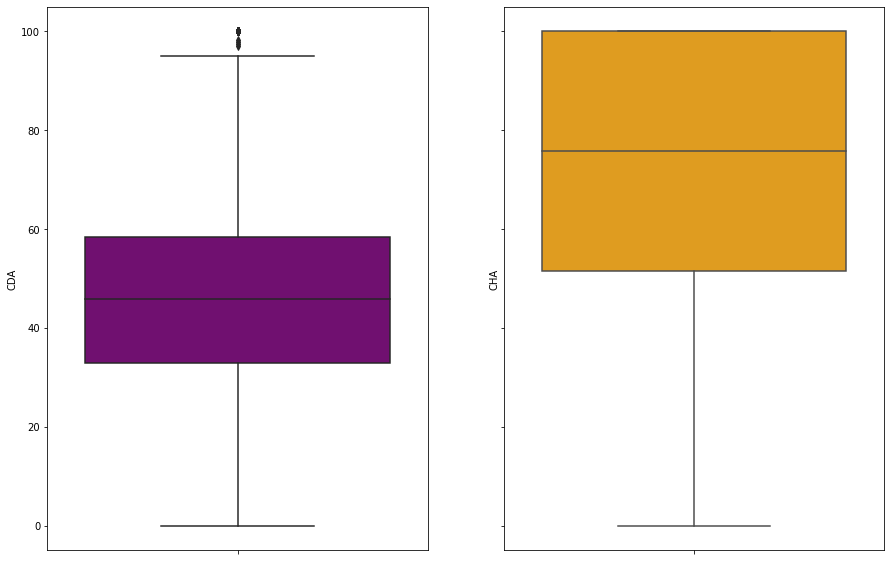

In [49]:
bp1 = fig, (ax) = plt.subplots(1,2,sharey=True, figsize=(15, 10))
ax[0] = sns.boxplot(y=data['CDA'],ax=ax[0],color='purple')
ax[1] = sns.boxplot(y=data['CHA'],ax=ax[1],color='orange')
plt.show()

In [ ]:
bx1.savefig('./templates/images/bp1.png')

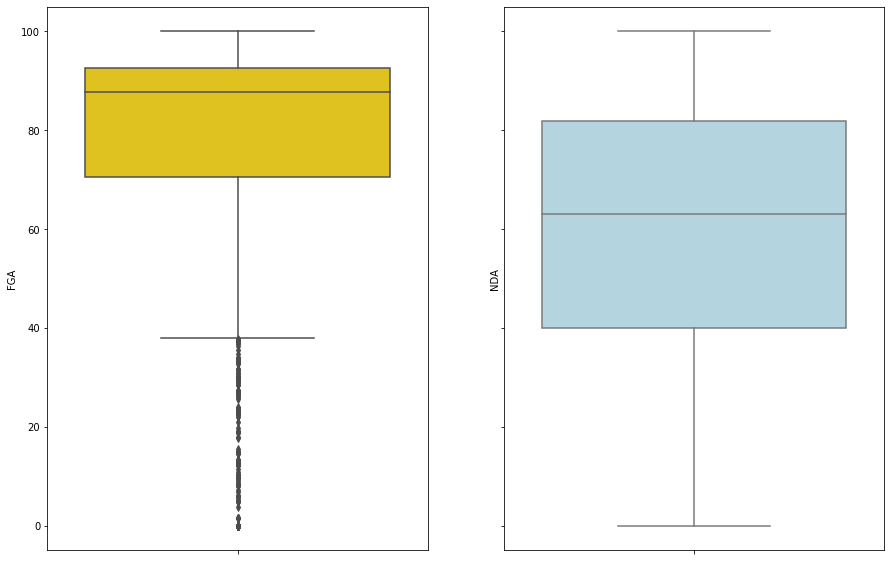

In [28]:
fig, (ax) = plt.subplots(1,2,sharey=True, figsize=(15, 10))
ax[0] = sns.boxplot(y=data['FGA'],ax=ax[0],color='gold')
ax[1] = sns.boxplot(y=data['NDA'],ax=ax[1],color='lightblue')
plt.show()

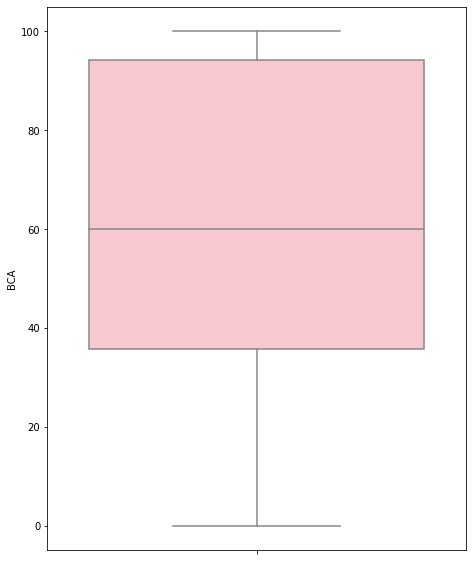

In [36]:
fig, (ax) = plt.subplots(sharey=True, figsize=(7.5, 10))
ax = sns.boxplot(y=data['BCA'],color='pink')
plt.show()